In [ ]:
import torch as t
import torch.nn.functional as F
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import os
import numpy as np
device = (
    "cuda" if t.cuda.is_available()
    else "mps" if t.backends.mps.is_available()
    else "cpu"
)

In [159]:
go.Layout.font = 'Times New Roman'

In [8]:
bs = 2**12
loss_fn = t.nn.L1Loss()
def compute_loss(net, bs=bs):
    x = t.rand(bs,2)
    l = x.sort().values
    x.requires_grad_()
    p = net(x)
    return loss_fn(p,l)
def sort_train(net, interactive=True):
    optimizer = t.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-4)
        
    for i in range(1,2**24 // bs):
        loss = compute_loss(net, bs)
        loss.backward()
        if interactive and i % 1000 == 0:
            print("loss:",loss)
        optimizer.step()
        optimizer.zero_grad()
    n = 4
    avg_loss = 0
    for _ in range(n):
        with t.no_grad():
            avg_loss += compute_loss(net, bs) / n
    return avg_loss

In [9]:
class BigNet(t.nn.Module):
    def __init__(self, h =10):
        super().__init__()
        self.fc1 = t.nn.Linear(2,h)
        self.fc2 = t.nn.Linear(h,2)
    def forward(self,x):
        x = self.fc1(x)
        F.relu(x, inplace=True)
        x = self.fc2(x)
        return x
        

In [10]:
bignet = BigNet(3)

In [11]:
sort_train(bignet)

loss: tensor(0.1090, grad_fn=<MeanBackward0>)
loss: tensor(0.0968, grad_fn=<MeanBackward0>)
loss: tensor(0.0975, grad_fn=<MeanBackward0>)
loss: tensor(0.0964, grad_fn=<MeanBackward0>)


tensor(0.0966)

In [12]:
file_path = 'simpledata.csv'
if os.path.exists(file_path):
    df = pd.read_csv(file_path)
else:
    data = []
    # run the experiment. This takes a long time
    for h in range(2,11): # It's only possible to get zero loss when h >= 3 
        for test in range(40):
            net = BigNet(h)
            loss = sort_train(net, interactive=False)
            data.append({'h':h, 'test':test, 'loss':loss.item()})
    df = pd.DataFrame(data)
    df.to_csv('simpledata.csv')

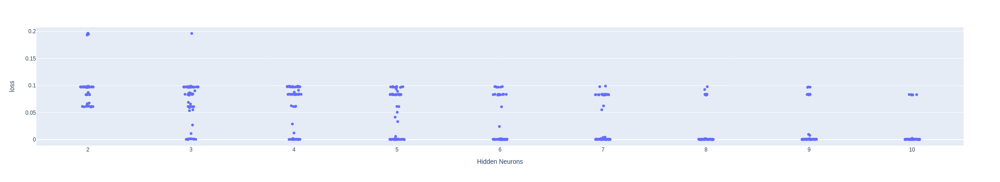

In [170]:
fig = px.strip(df, x='h', y='loss',
               labels={'h':'Hidden Neurons', }
              )            
fig.update_layout(height=400, width=800)
fig.show()

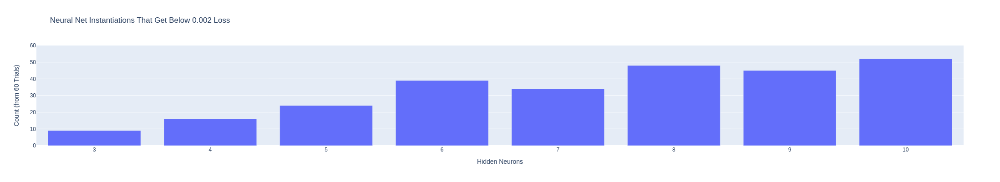

In [171]:
df_summary = df.groupby('h').agg(
    small_loss_count=('loss', lambda x: (x < 0.002).sum())
).reset_index()
df_summary = df_summary[df_summary['h'] != 2]
fig = px.bar(df_summary, x='h', y='small_loss_count', 
             title='Neural Net Instantiations That Get Below 0.002 Loss',
             labels=dict(h='Hidden Neurons', small_loss_count='Count (from 60 Trials)'),
             range_y=[0,60])
fig.update_layout(height=400, width=800)
fig.show()


In [101]:
def good_net(h, lbound=0, ubound=.002):
    loss = 1
    while loss > ubound or loss < lbound:
        net = BigNet(h)
        loss = sort_train(net, interactive=False)
    return net

In [208]:
def graph_input_space(net):
    # The first contour line when the relu switches from zero to positives doesn't show up.
    x = t.linspace(-0.5,1.5,100)
    y = t.linspace(-0.5,1.5,100)
    c = t.permute(t.stack(t.meshgrid(x,y, indexing='ij')), (1,2,0))
    with t.no_grad(): 
        z = net(c)

    n = z.shape[2]
    op = 1/n
    contours = []
    for i in range(0,n):
        cs = [[0, 'rgba(0,0,0,0)'], [0.0001, px.colors.cyclical.mygbm[3*i]],  [1, 'rgba(255,255,255,0)']]
        contours.append(go.Contour(x=x, y=y, z=z[:,:,i], 
                                   colorscale=cs, 
                                   opacity=op, 
                                   contours=dict(start=0.01, end=2),
                                   line=dict(smoothing=0),
                                   showscale=False))
    fig = go.Figure(data = contours)
    fig.update_layout(
        showlegend=False,
        width=500,
        height=500,
    )
#    fig.update_xaxes(tickvals=np.linspace(0, 99, 5), ticktext=np.linspace(-0.5, 1.5, 5))
#    fig.update_yaxes(tickvals=np.linspace(0, 99, 5), ticktext=np.linspace(-0.5, 1.5, 5))
    fig.show()
    
def graph_activations(net):
    with t.no_grad():
        chopped1 = t.nn.Sequential(
            net.fc1,
            t.nn.ReLU(),
        )
        chopped2 = t.nn.Sequential(
            net.fc1,
            t.nn.ReLU(),
            net.fc2,
            t.nn.ReLU(),
        )
    graph_input_space(chopped1)
    graph_input_space(chopped2)

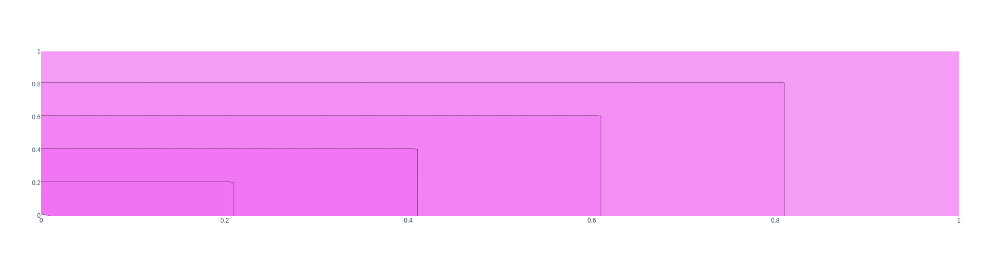

In [206]:
graph_input_space(lambda c: t.max(c, dim=2).values.unsqueeze(2))

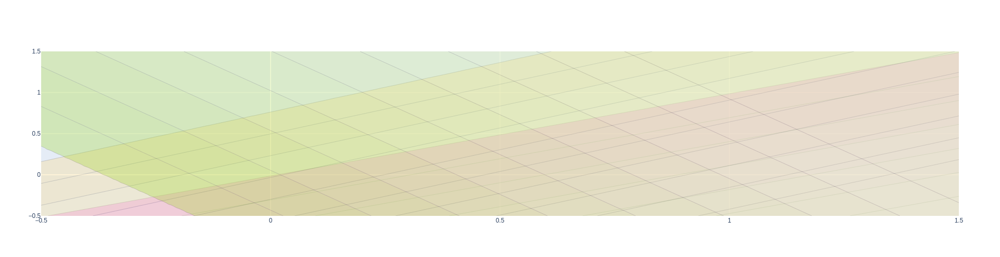

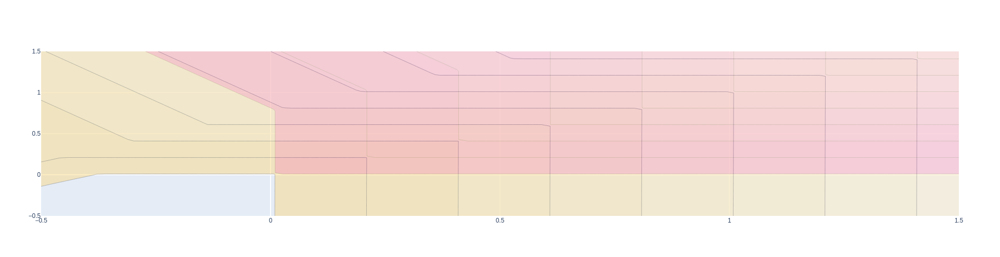

In [210]:
net3 = good_net(3)
graph_activations(net3)

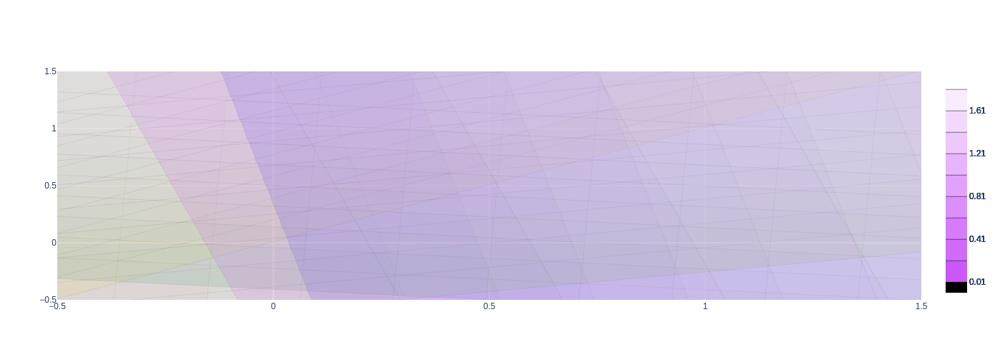

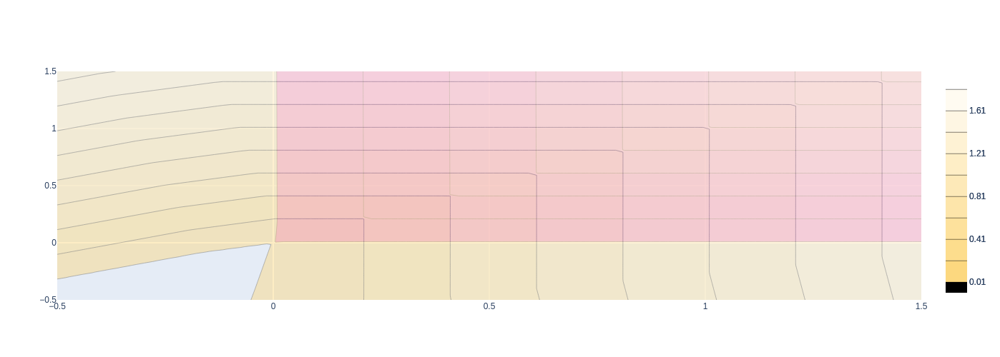

In [146]:
net6 = good_net(6)
graph_activations(net6)

In [89]:
net6(t.tensor([30,20.]))

tensor([20.0051, 29.9954], grad_fn=<ViewBackward0>)

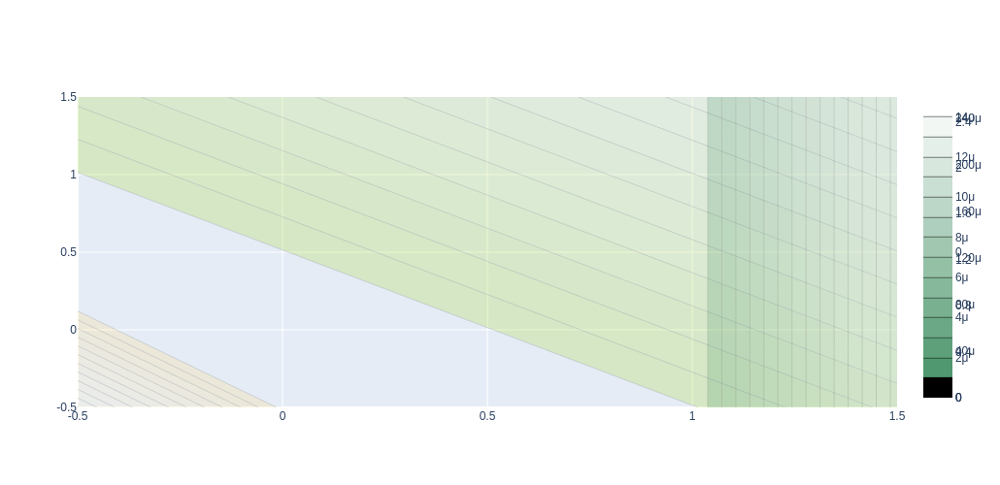

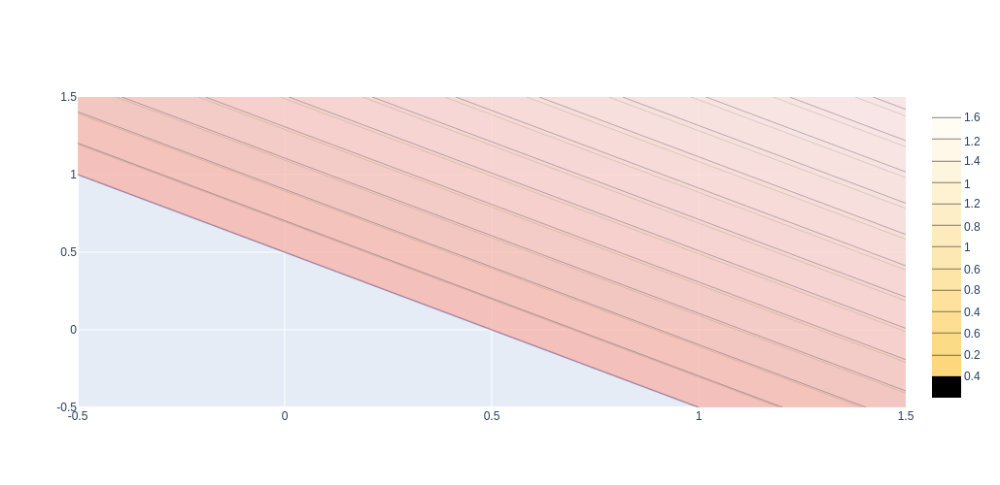

In [83]:
net4_1 = good_net(4, .09,.1)
graph_activations(net4_1)

In [ ]:
net4_2 = good_net(4, .08, .09)
graph_activations(net4_2)

In [188]:
def loss_over_time_data(n=6):
    # post-selected to only graph the training runs that reach the global minimum
    data = []
    for h in range(3,11):
        test_count = 0
        discarded_tests = 0
        while test_count < n:
            testdata = []
            net = BigNet(h)
            optimizer = t.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-4)
            for i in range(2**24 // bs):
                loss = compute_loss(net, bs)
                loss.backward()
                optimizer.step()
                optimizer.zero_grad()
                if i % 16 == 0:
                    testdata.append({'h':h, 'step':i, 'test': test_count, 'loss':loss.item()})
            if compute_loss(net, bs) < .002:
                data += testdata
                test_count += 1
            else:
                discarded_tests += 1
    df = pd.DataFrame(data)
    return df

def line_graph(df, h):
    dfh = df[df['h'] == h]
    fig = px.line(dfh, x='step', y='loss', color='test', range_y=[0,0.2], title=f'Loss During Training. {h} Hidden Neurons')
    fig.update_layout(height=400, width=800, showlegend=False)
    fig.show()
    

In [180]:
df2 = loss_over_time_data(20)
df2.to_csv('loss_over_time.csv')

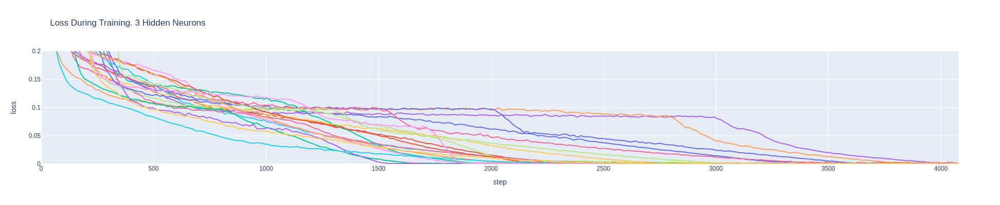

In [189]:
line_graph(df2, 3)

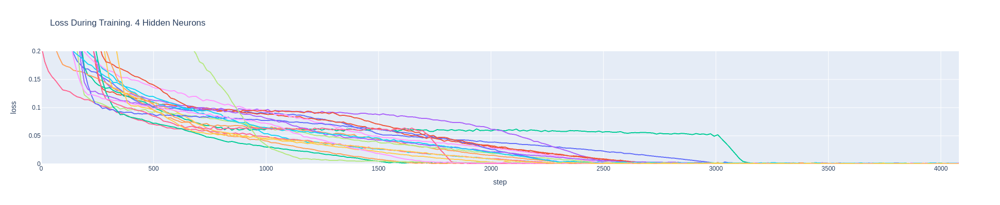

In [190]:
line_graph(df2,4)

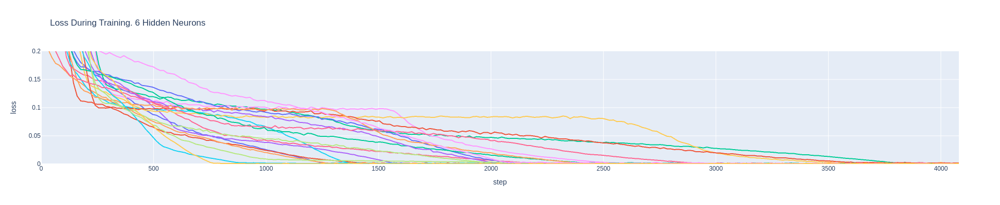

In [191]:
line_graph(df2, 6)

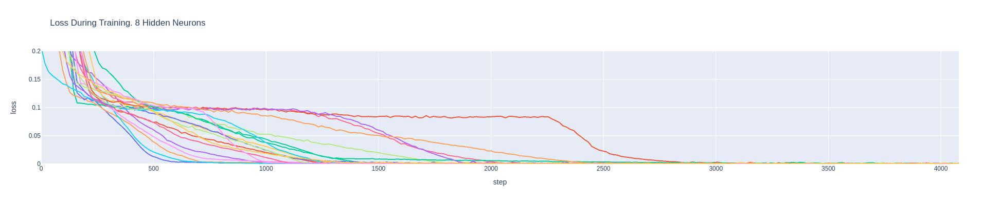

In [192]:
line_graph(df2,8)

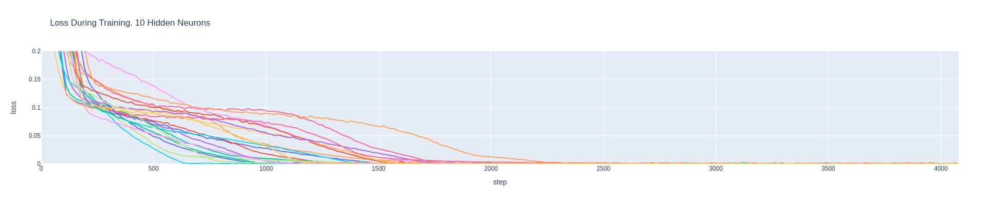

In [193]:
line_graph(df2, 10)